# Containment

In [1]:
import sys; sys.path.append("../")
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import control
from utils import create_network_of_agents, has_reached_consensus
from scipy.spatial import ConvexHull
import matplotlib.animation
from IPython.display import HTML

from typing import Literal


VARS_DIM = 2
SAMPLING_TIME = 0.01

NUM_LEADERS = 5
NUM_FOLLOWERS = 10
NUM_AGENTS = NUM_LEADERS + NUM_FOLLOWERS

TIME = "continuous"
# TIME = "discrete"

SEED = 42
rng = np.random.default_rng(SEED)

In [2]:
def get_animation(history_x, num_leaders, num_followers, vars_dim, horizon, sampling_time):
    num_agents = num_leaders + num_followers

    def animate(t):
        t = t * sampling_time
        x_t = history_x[t]
        plt.clf()

        # Plot convex hull
        leaders_pos = x_t[num_followers:]
        hull = ConvexHull(leaders_pos)
        plt.fill(leaders_pos[hull.vertices, 0], leaders_pos[hull.vertices, 1], color="darkred", alpha=0.3)

        # Plot agent position
        for i in range(num_agents):
            plt.plot(x_t[i, 0], x_t[i, 1], marker="o", markersize=5, fillstyle="full", color=("blue" if i < num_followers else "red"))

        # Plot trajectories
        for i in range(num_agents):
            plt.plot(history_x[:t+1, i, 0], history_x[:t+1, i, 1], "--", linewidth=1, color=("tab:blue" if i < num_followers else "tab:red"), alpha=0.6)

        plt.title(f"Agents position - time = {horizon[t + sampling_time]:.2f} s of {horizon[-1]:.2f} s")

    anim = matplotlib.animation.FuncAnimation(plt.gcf(), animate, frames=len(range(0, len(horizon)-sampling_time, sampling_time)))
    return anim


def plot_trajectory(history_x, num_leaders, num_followers, vars_dim):
    num_agents = num_leaders + num_followers

    plt.figure(figsize=(12, 6))
    for i in range(vars_dim):
        plt.subplot(vars_dim//2+1, 2, i+1)
        plt.title(f"Trajectory axis {i}")
        plt.plot(history_x[:, :num_followers, i], color="tab:blue")
        plt.plot(history_x[:, num_followers:, i], color="tab:red")
    plt.show()

In [3]:
_, adj_matrix = create_network_of_agents(
    NUM_AGENTS,
    "unweighted",
    connected = True,
    seed = SEED
)

degree_matrix = np.diag( np.sum(adj_matrix, axis=0) )
laplacian = degree_matrix - adj_matrix.T

x0 = np.zeros((NUM_AGENTS, VARS_DIM))
x0[:NUM_FOLLOWERS] = 10 * rng.random((NUM_FOLLOWERS, VARS_DIM))
x0[NUM_FOLLOWERS:] = 5 * rng.random((NUM_LEADERS, VARS_DIM))

## Static leaders

\begin{equation}
    \texttt{A\_for\_1\_axis} = \begin{bmatrix}
        -L_f & -L_{fl} \\
        0 & 0 \\
    \end{bmatrix}
\end{equation}

In [4]:
def _get_standard_containment_lti_system(laplacian, num_leaders, num_followers, vars_dim, time: Literal["continuous","discrete"]="continuous"):
    num_agents = num_followers + num_leaders
    L_f = laplacian[0:num_followers, 0:num_followers]   # Followers' dynamics
    L_fl = laplacian[0:num_followers, num_followers:]   # The rest

    # Containment control law
    A_for_1_axis = -np.block([
        [L_f, L_fl],
        [np.zeros((num_leaders, num_agents))],
    ])

    # Used to apply the leaders' velocity
    B_for_1_axis = np.block([
        [np.zeros((num_followers, num_leaders))],
        [np.eye(num_leaders)],
    ])

    # np.kron to apply the same matrices to each axis of the state
    A = np.kron(A_for_1_axis, np.eye(vars_dim))
    B = np.kron(B_for_1_axis, np.eye(vars_dim))
    C = np.kron(np.eye(num_agents), np.eye(vars_dim)) # [I \\ 0]  -->  used the get a system that only depends on the state (x)

    if time == "continuous":
        # Creates a linear time invariant system
        # control.StateSpace(A, B, C, D) --> dx = Ax + Bu     y = Cx + Du
        # In this case, x is the position and u the leaders' velocity
        lti_system = control.StateSpace(A, B, C, 0) # dx = -Lx + [0 I]u     y = [I 0] x
        return lti_system
    elif time == "discrete":
        return A, B


def containment(x0, laplacian, max_time, sampling_time, leaders_velocity, num_leaders, num_followers, vars_dim, time: Literal["continuous","discrete"]="continuous"):
    horizon = np.arange(0.0, max_time+SAMPLING_TIME, sampling_time)
    history_leaders_vel = np.ones((len(horizon), vars_dim * num_leaders)) * leaders_velocity

    if time == "continuous":
        lti_system = _get_standard_containment_lti_system(laplacian, num_leaders, num_followers, vars_dim, time)
        
        horizon, history_x = control.forced_response( # Solves the system
            lti_system, 
            X0 = x0.flatten(), 
            U = history_leaders_vel.T, 
            T = horizon
        )
        history_x = history_x.T
    elif time == "discrete":
        A, B = _get_standard_containment_lti_system(laplacian, num_leaders, num_followers, vars_dim, time)
        history_x = np.zeros((len(horizon), A.shape[1]))
        history_x[0] = x0.flatten()

        for k in range(len(horizon) - 1):
            history_x[k+1] = history_x[k] + sampling_time*(A @ history_x[k] + B @ history_leaders_vel[k])
        
    return history_x.reshape(-1, num_leaders+num_followers, vars_dim), horizon

In [5]:
history_x_static, horizon_static = containment(
    x0.copy(), 
    laplacian.copy(),
    max_time = 5.0,
    sampling_time = SAMPLING_TIME,
    leaders_velocity = 0.0,
    num_leaders = NUM_LEADERS, 
    num_followers = NUM_FOLLOWERS, 
    vars_dim = VARS_DIM,
    time = TIME
)

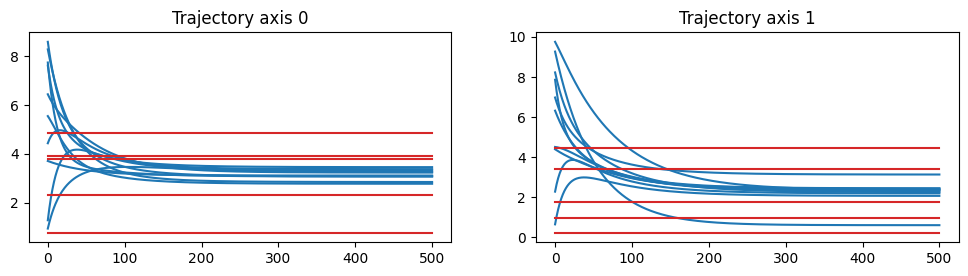

In [6]:
%matplotlib inline
plot_trajectory(history_x_static, NUM_LEADERS, NUM_FOLLOWERS, VARS_DIM)

In [7]:
%matplotlib notebook
ani = get_animation(history_x_static, NUM_LEADERS, NUM_FOLLOWERS, VARS_DIM, horizon_static, sampling_time=10)
HTML(ani.to_jshtml())

<IPython.core.display.Javascript object>

## Non-static leaders

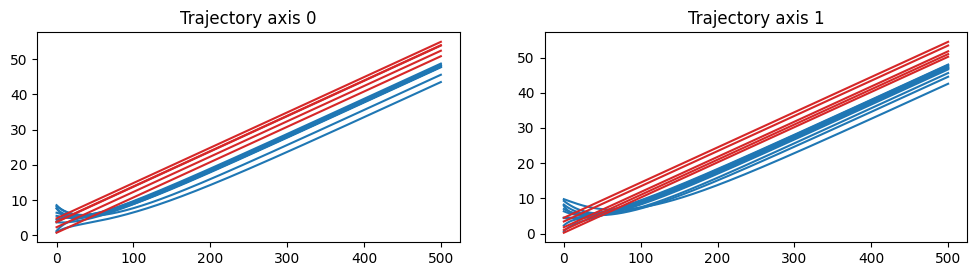

In [8]:
history_x_non_static, horizon_non_static = containment(
    x0.copy(), 
    laplacian.copy(),
    max_time = 5.0,
    sampling_time = SAMPLING_TIME,
    # leaders_velocity = 1.0,
    leaders_velocity = 10.0,
    num_leaders = NUM_LEADERS, 
    num_followers = NUM_FOLLOWERS, 
    vars_dim = VARS_DIM,
    time = TIME
)

%matplotlib inline
plot_trajectory(history_x_non_static, NUM_LEADERS, NUM_FOLLOWERS, VARS_DIM)

In [9]:
%matplotlib notebook
ani = get_animation(history_x_non_static, NUM_LEADERS, NUM_FOLLOWERS, VARS_DIM, horizon_non_static, sampling_time=10)
HTML(ani.to_jshtml())

<IPython.core.display.Javascript object>

## Non-static leaders with integral action

\begin{equation}
    \texttt{A\_1d\_ext} = \begin{bmatrix}
        -L_f & -L_{fl} & K_I \\
        0 & 0 & 0 \\
        L_f & L_{fl} & 0
    \end{bmatrix}
\end{equation}

In [10]:
def _get_integral_action_containment_lti_system(laplacian, integral_gain, num_leaders, num_followers, vars_dim, time: Literal["continuous","discrete"]="continuous"):
    num_agents = num_followers + num_leaders
    L_f = laplacian[0:num_followers, 0:num_followers]   # Followers' dynamics
    L_fl = laplacian[0:num_followers, num_followers:]   # The rest

    # Containment control law
    A_for_1_axis = -np.block([
        [L_f, L_fl],
        [np.zeros((num_leaders, num_agents))],
    ])
    # Used to apply the leaders' velocity
    B_for_1_axis = np.block([
        [np.zeros((num_followers, num_leaders))],
        [np.eye(num_leaders)],
    ])

    # Weights (gain) for the followers' integral error (K_I)
    K_integral = np.block([
        [-integral_gain * np.eye(num_followers)],
        [np.zeros((num_leaders, num_followers))],
    ])

    # Extended control law
    A_1d_ext = np.block([
        [A_for_1_axis, K_integral],
        [L_f, L_fl, np.zeros((num_followers, num_followers))], # Dynamics of xi
    ])

    B_1d_ext = np.block([
        [B_for_1_axis],
        [np.zeros((num_followers, num_leaders))],
    ])

    # np.kron to apply the same matrices to each axis of the state
    A = np.kron(A_1d_ext, np.eye(vars_dim))
    B = np.kron(B_1d_ext, np.eye(vars_dim))
    C = np.kron( # [I 0 \\ 0 0]  -->  used the get a system that only depends on the state (x), padded for the integral action
        np.block([np.eye(num_agents), np.zeros((num_agents, num_followers))]),
        np.eye(vars_dim),
    )

    if time == "continuous":
        # Creates a linear time invariant system
        # control.StateSpace(A, B, C, D) --> dx = Ax + Bu     y = Cx + Du
        # In this case, x is the position and u the leaders' velocity
        lti_system = control.StateSpace(A, B, C, 0) # dx = -Lx + [0 I]u     y = [I 0] x
        return lti_system
    elif time == "discrete":
        return A, B


def containment_integral_action(x0, laplacian, max_time, sampling_time, leaders_velocity, xi_0, integral_gain, num_leaders, num_followers, vars_dim, time: Literal["continuous","discrete"]="continuous"):
    num_agents = num_followers + num_leaders
    horizon = np.arange(0.0, max_time+SAMPLING_TIME, sampling_time)
    history_leaders_vel = np.ones((len(horizon), vars_dim * num_leaders)) * leaders_velocity
    
    if time == "continuous":
        lti_system = _get_integral_action_containment_lti_system(laplacian, integral_gain, num_leaders, num_followers, vars_dim, time)
        
        horizon, history_x = control.forced_response( # Solves the system
            lti_system, 
            X0 = np.concatenate([x0, xi_0]).flatten(), 
            U = history_leaders_vel.T, 
            T = horizon
        )
        history_x = history_x.T
    elif time == "discrete":
        A, B = _get_integral_action_containment_lti_system(laplacian, integral_gain, num_leaders, num_followers, vars_dim, time)
        history_x = np.zeros((len(horizon), A.shape[1]))
        history_x[0] = np.concatenate([x0, xi_0]).flatten()

        for k in range(len(horizon) - 1):
            history_x[k+1] = history_x[k] + sampling_time*(A @ history_x[k] + B @ history_leaders_vel[k])
        history_x = history_x[:, :num_agents*vars_dim]

    return history_x.reshape(-1, num_leaders+num_followers, vars_dim), horizon

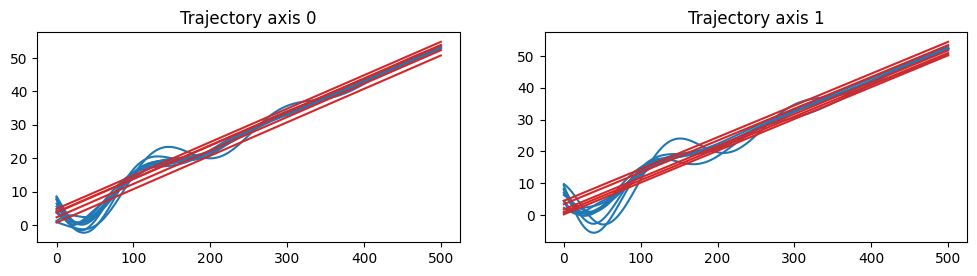

In [11]:
history_x_non_static_integral, horizon_non_static_integral = containment_integral_action(
    x0.copy(),
    laplacian.copy(),
    max_time = 5.0,
    sampling_time = SAMPLING_TIME,
    leaders_velocity = 10.0,
    # xi_0 = np.zeros((NUM_FOLLOWERS, VARS_DIM)),
    xi_0 = 5*rng.random((NUM_FOLLOWERS, VARS_DIM)),
    # integral_gain = 0.1,
    # integral_gain = 1,
    integral_gain = 10,
    # integral_gain = 100,
    num_leaders = NUM_LEADERS, 
    num_followers = NUM_FOLLOWERS, 
    vars_dim = VARS_DIM,
    time = TIME
)

%matplotlib inline
plot_trajectory(history_x_non_static_integral, NUM_LEADERS, NUM_FOLLOWERS, VARS_DIM)

In [12]:
%matplotlib notebook
ani = get_animation(history_x_non_static_integral, NUM_LEADERS, NUM_FOLLOWERS, VARS_DIM, horizon_non_static_integral, sampling_time=10)
HTML(ani.to_jshtml())

<IPython.core.display.Javascript object>